In [1]:
%matplotlib inline

import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import xarray as xr
import cmocean.cm as cmocean
import glob

import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client
import matplotlib.path as mpath
import datetime as dt

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 4
Total threads: 4,Total memory: 100.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41123,Workers: 4
Dashboard: /proxy/8787/status,Total threads: 4
Started: Just now,Total memory: 100.00 GiB
Comm: tcp://10.6.121.4:33527,Total threads: 1
Dashboard: /proxy/36797/status,Memory: 25.00 GiB
Nanny: tcp://127.0.0.1:42229,


In [3]:
# database for control simulation:
master_session = cc.database.create_session('/g/data/ik11/databases/cosima_master.db')

In [4]:
from cosima_cookbook import explore
dbx = explore.DatabaseExplorer #(session=session)
dbx

cosima_cookbook.explore.DatabaseExplorer

In [5]:
ee = explore.ExperimentExplorer(session=master_session, experiment='01deg_jra55v13_ryf9091')
ee

ExperimentExplorer(children=(HTML(value='\n            <h3>Experiment Explorer</h3>\n\n            <p>Select a…

In [6]:
import cartopy.feature as cft
land_50m = cft.NaturalEarthFeature('physical', 'land', '50m',
                                   edgecolor='black', facecolor='gray', linewidth=0.5)

In [7]:
expt='01deg_jra55v140_iaf'
variable='tmask'
tmask = cc.querying.getvar('01deg_jra55v140_iaf','ht',master_session,n=1).sel(yt_ocean=slice(-90,-55))
#ht = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
tmask.load()
print(tmask.shape)

expt='01deg_jra55v140_iaf'
variable='ht'
ht = cc.querying.getvar('01deg_jra55v140_iaf','ht',master_session,n=1).sel(yt_ocean=slice(-90,-55))
#ht = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
ht.load()
print(ht.shape)

expt='01deg_jra55v140_iaf'
variable='xt_ocean'
xt_ocean = cc.querying.getvar(expt,variable,master_session, n=-1).fillna(1.0).astype(int) - 1
xt_ocean.load()
print(xt_ocean.shape)

expt='01deg_jra55v140_iaf'
variable='yt_ocean'
yt_ocean = cc.querying.getvar(expt,variable,master_session, n=-1).fillna(1.0).astype(int) - 1
yt_ocean.load()
print(yt_ocean.shape)

variable='area_t'
area_t = cc.querying.getvar(expt,variable,master_session, n=-1).fillna(1.0).astype(int) - 1
area_t.load()
print(area_t.shape)

variable='geolon_t'
geolon_t = cc.querying.getvar(expt,variable,master_session, n=-1).fillna(1.0).astype(int) - 1
geolon_t.load()
print(geolon_t.shape)

variable='geolat_t'
geolat_t = cc.querying.getvar(expt,variable,master_session, n=-1).fillna(1.0).astype(int) - 1
geolat_t.load()
print(geolat_t.shape)

variable='xu_ocean'
xu_ocean = cc.querying.getvar(expt,variable,master_session, n=-1).fillna(1.0).astype(int) - 1
xu_ocean.load()
print(xu_ocean.values)

variable='yu_ocean'
yu_ocean = cc.querying.getvar(expt,variable,master_session, n=-1).fillna(1.0).astype(int) - 1
yu_ocean.load()
print(yu_ocean.shape)

variable='area_u'
area_u = cc.querying.getvar(expt,variable,master_session, n=-1).fillna(1.0).astype(int) - 1
area_u.load()
print(area_u.shape)

(584, 3600)
(584, 3600)
(3600,)
(2700,)
(2700, 3600)
(2700, 3600)
(2700, 3600)
[-280 -280 -280 ...   78   78   79]
(2700,)
(2700, 3600)


In [8]:
#do maskito_netcdfepths = (0,300)
#htmask = temp.where(~xr.ufuncs.isfinite(temp.where(ht>1000)))
#htmask = ~xr.ufuncs.isnan(htmask).to_dataset(name='htmask')
#htmask

#var.where((var.lat<5) & (var.lat>-5) & (var.lon>190) & (var.lon<240),drop=True

somask = ht.where(~xr.ufuncs.isfinite(ht.where(yt_ocean>-50)))
somask = ~xr.ufuncs.isnan(somask).to_dataset(name='somask')

shmask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
shmask = shmask.where(~xr.ufuncs.isfinite(shmask.where(yt_ocean>-63)))
shmask = ~xr.ufuncs.isnan(shmask).to_dataset(name='shmask')

#wap_mask = ht.where(~xr.ufuncs.isfinite(ht.where( (ht>1000) & (yt_ocean>-60) & (xt_ocean<-75) & (xt_ocean>-63) )))
wap_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
wap_mask = wap_mask.where(~xr.ufuncs.isfinite(wap_mask.where(yt_ocean>-63)))
wap_mask=wap_mask.where(~xr.ufuncs.isfinite(wap_mask.where(xt_ocean<-75)))
wap_mask=wap_mask.where(~xr.ufuncs.isfinite(wap_mask.where(xt_ocean>-63)))
wap_mask = ~xr.ufuncs.isnan(wap_mask).to_dataset(name='wap_mask')

#bs_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-101) & (xt_ocean>-76) )))
bs_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
bs_mask = bs_mask.where(~xr.ufuncs.isfinite(bs_mask.where(yt_ocean>-63)))
bs_mask=bs_mask.where(~xr.ufuncs.isfinite(bs_mask.where(xt_ocean<-101)))
bs_mask=bs_mask.where(~xr.ufuncs.isfinite(bs_mask.where(xt_ocean>-76)))
bs_mask = ~xr.ufuncs.isnan(bs_mask).to_dataset(name='bs_mask')

#as_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-127) & (xt_ocean>-102) )))
as_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
as_mask = as_mask.where(~xr.ufuncs.isfinite(as_mask.where(yt_ocean>-63)))
as_mask=as_mask.where(~xr.ufuncs.isfinite(as_mask.where(xt_ocean<-127)))
as_mask=as_mask.where(~xr.ufuncs.isfinite(as_mask.where(xt_ocean>-102)))
as_mask = ~xr.ufuncs.isnan(as_mask).to_dataset(name='as_mask')

#revised area of AS ice shelves based on Fig. 4e inset of Admusilli https://doi.org/10.1038/s41561-020-0616-z
#as_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-127) & (xt_ocean>-102) )))
as_mask2 = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
as_mask2 = as_mask2.where(~xr.ufuncs.isfinite(as_mask2.where(yt_ocean>-63)))
as_mask2=as_mask2.where(~xr.ufuncs.isfinite(as_mask2.where(xt_ocean<-137)))
as_mask2=as_mask2.where(~xr.ufuncs.isfinite(as_mask2.where(xt_ocean>-102)))
as_mask2 = ~xr.ufuncs.isnan(as_mask2).to_dataset(name='as_mask2')

#mb_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-158) & (xt_ocean>-103) )))
mb_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
mb_mask = mb_mask.where(~xr.ufuncs.isfinite(mb_mask.where(yt_ocean>-63)))
mb_mask=mb_mask.where(~xr.ufuncs.isfinite(mb_mask.where(xt_ocean<-158)))
mb_mask=mb_mask.where(~xr.ufuncs.isfinite(mb_mask.where(xt_ocean>-103)))
mb_mask = ~xr.ufuncs.isnan(mb_mask).to_dataset(name='mb_mask')

#mb_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-158) & (xt_ocean>-103) )))
ros_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
ros_mask = ros_mask.where(~xr.ufuncs.isfinite(ros_mask.where(yt_ocean>-63)))
ros_mask=ros_mask.where(~xr.ufuncs.isfinite(ros_mask.where(xt_ocean<-196)))
ros_mask=ros_mask.where(~xr.ufuncs.isfinite(ros_mask.where(xt_ocean>-159)))
ros_mask = ~xr.ufuncs.isnan(ros_mask).to_dataset(name='ros_mask')


#mb_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-158) & (xt_ocean>-103) )))
ea1_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
ea1_mask = ea1_mask.where(~xr.ufuncs.isfinite(ea1_mask.where(yt_ocean>-63)))
ea1_mask=ea1_mask.where(~xr.ufuncs.isfinite(ea1_mask.where(xt_ocean<-280)))
ea1_mask=ea1_mask.where(~xr.ufuncs.isfinite(ea1_mask.where(xt_ocean>-197)))
ea1_mask = ~xr.ufuncs.isnan(ea1_mask).to_dataset(name='ea1_mask')

ea2_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
ea2_mask = ea2_mask.where(~xr.ufuncs.isfinite(ea2_mask.where(yt_ocean>-63)))
ea2_mask=ea2_mask.where(~xr.ufuncs.isfinite(ea2_mask.where(xt_ocean<-10)))
#ea2_mask=ea2_mask.where(~xr.ufuncs.isfinite(ea2_mask.where(xt_ocean>-80)))
ea2_mask = ~xr.ufuncs.isnan(ea2_mask).to_dataset(name='ea2_mask')

wed_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
wed_mask = wed_mask.where(~xr.ufuncs.isfinite(wed_mask.where(yt_ocean>-63)))
wed_mask=wed_mask.where(~xr.ufuncs.isfinite(wed_mask.where(xt_ocean<-61)))
wed_mask=wed_mask.where(~xr.ufuncs.isfinite(wed_mask.where(xt_ocean>-10)))
wed_mask = ~xr.ufuncs.isnan(wed_mask).to_dataset(name='wed_mask')

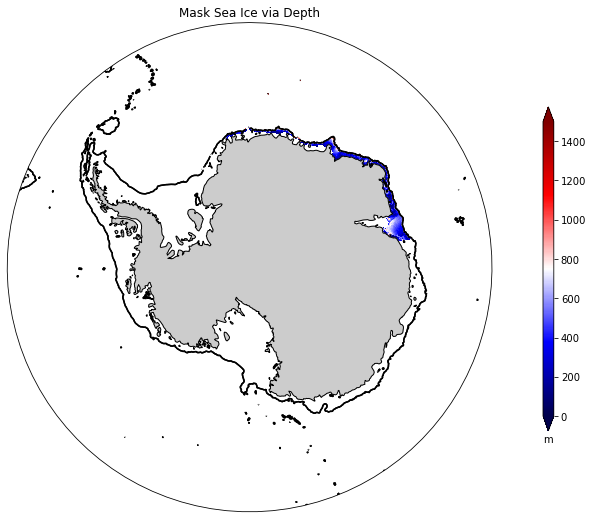

In [9]:
#plot mask for check
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

#anom=temp.where(tmask.tmask).sel(st_ocean=(200,700)).mean(dim='st_ocean')
#t=temp.isel(st_ocean=0)


p1 = ht.where(ea2_mask.ea2_mask).plot.pcolormesh(x='xt_ocean', y='yt_ocean', vmin=0, vmax=1500, add_colorbar=False, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

#p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx73.values-decavg73_tx.values, ty73.values-decavg73_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('Mask Sea Ice via Depth')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('m');



In [10]:
#Frequency, experiment and session do not need to be specified if they were defined in the previous step
def getACCESSdata(var, start, end, exp, freq, ses, minlon, maxlon, minlat = -90, maxlat = -45):
    '''
    Inputs:
    var - Short name for the variable of interest
    start - Time from when data has to be returned
    end - Time until when data has to be returned
    exp - Experiment name
    freq - Time frequency of the data
    ses - Cookbook session
    minlat - minimum latitude from which to return data. If not set, defaults to min latitude in geolon_t data array.
    maxlat - maximum latitude from which to return data. If not set, defaults to max latitude in geolon_t data array.
    minlon - minimum longitude from which to return data. If not set, defaults to -90 to cover the Southern Ocean.
    maxlon - minimum longitude from which to return data. If not set, defaults to -45 to cover the Southern Ocean.

    Output:
    Data array with corrected time and coordinates within the specified time period and spatial bounding box.
    '''
    #Accessing data
    vararray = cc.querying.getvar(exp, var, ses, frequency = freq, start_time = start, end_time = end)
    #Applying time correction
    vararray['time'] = vararray.time - dt.timedelta(hours = 12)
    # assign new coordinates to SST dataset
    #.coords extracts the values of the coordinate specified in the brackets
    vararray.coords['ni'] = geolon_t['xt_ocean'].values
    vararray.coords['nj'] = geolon_t['yt_ocean'].values
    #Rename function from xarray uses dictionaries to change names. Keys refer to current names and values are the desired names
    vararray = vararray.rename(({'ni':'xt_ocean', 'nj':'yt_ocean'}))
    #Subsetting data to area of interest
    #Subsetting sea ice concentration array
    vararray = vararray.sel(xt_ocean = slice(minlon, maxlon)).sel(yt_ocean = slice(minlat, maxlat))
    return vararray

In [11]:
control = '01deg_jra55v13_ryf9091'

# database for perturbations:
easterlies_session = cc.database.create_session('/g/data/v45/akm157/model_data/access-om2/01deg_jra55v13_ryf9091_easterlies_up10/easterlies.db')
# 10% increase in easterly wind speed:
easterlies_up = '01deg_jra55v13_ryf9091_easterlies_up10'
# 10% decrease in easterly wind speed:
easterlies_down = '01deg_jra55v13_ryf9091_easterlies_down10'

In [29]:
#look at first 2 years
#calc ice volume anomalies in different sectors
start_time='2150-01-01'
end_time='2152-12-31'

lat_slice  = slice(-80,-50)

In [30]:
hi_m_con=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_con=hi_m_con.sel(time=slice(start_time,end_time))
hi_m_con

#http://www.ccpo.odu.edu/~klinck/Reprints/PDF/cicedoc2015.pdf
#note:The ice fraction ai (aice) is the total fractional ice coverage of a grid cell. That is, in each cell,
#ai = 0 if there is no ice
#ai = 1 if there is no open water
#0 < ai < 1 if there is both ice and open water

ai_m_con=getACCESSdata(var='aice_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
ai_m_con=ai_m_con.sel(time=slice(start_time,end_time))
ai_m_con

<xarray.DataArray 'aice_m' (time: 36, yt_ocean: 740, xt_ocean: 3600)>
dask.array<getitem, shape=(36, 740, 3600), dtype=float32, chunksize=(1, 675, 900), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) object 2150-01-31 12:00:00 ... 2152-12-31 12:00:00
    TLON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    TLAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged
    time_bounds:    <xarray.DataArray 'time_bounds' (time: 37, d2: 2)>\ndask....

In [40]:
#checking area integration weighting vs area_T
siv_con_so1=(hi_m_con*ai_m_con).where(somask.somask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()

siv_con_so2=(hi_m_con*ai_m_con*area_t)
siv_con_so2=siv_con_so2.where(somask.somask).sum(dim=('xt_ocean','yt_ocean')).compute()

In [41]:
print(siv_con_so1.mean(dim='time'),siv_con_so2.mean(dim='time'))

<xarray.DataArray ()>
array(8.23897515e+12) <xarray.DataArray ()>
array(8.23897515e+12)


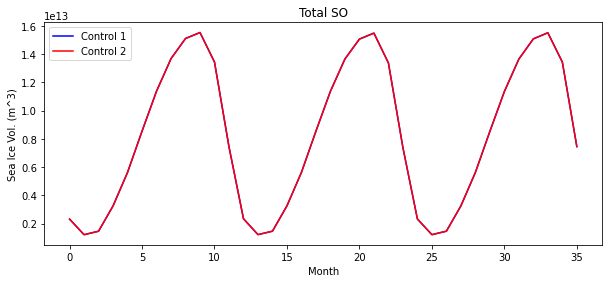

In [42]:
yrs=np.arange(0,36,1)
fig = plt.figure(figsize=(10, 9))
plt.subplot(211)
plt.plot(yrs,siv_con_so1,linestyle='-',color='b',label='Control 1',linewidth=1.5)
plt.plot(yrs,siv_con_so2,linestyle='-',color='r',label='Control 2',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='b',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Month')
#plt.xlim([-75,85])
plt.title('Total SO')
plt.legend(fontsize=10)

In [45]:
siv_con=(hi_m_con*ai_m_con)

siv_con_so=siv_con.where(somask.somask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_shelf=siv_con.where(shmask.shmask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_wapsh=siv_con.where(wap_mask.wap_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_bssh=siv_con.where(bs_mask.bs_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_assh=siv_con.where(as_mask2.as_mask2).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_rossh=siv_con.where(ros_mask.ros_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_ea1sh=siv_con.where(ea1_mask.ea1_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_ea2sh=siv_con.where(ea2_mask.ea2_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_wedsh=siv_con.where(wed_mask.wed_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()

In [46]:
hi_m_up=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_up = hi_m_up.sel(time=slice(start_time,end_time))#.sel(TLAT=lat_slice)
hi_m_up = hi_m_up.load()

ai_m_up=getACCESSdata(var='aice_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
ai_m_up=ai_m_con.sel(time=slice(start_time,end_time))
ai_m_up

<xarray.DataArray 'aice_m' (time: 36, yt_ocean: 740, xt_ocean: 3600)>
dask.array<getitem, shape=(36, 740, 3600), dtype=float32, chunksize=(1, 675, 900), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) object 2150-01-31 12:00:00 ... 2152-12-31 12:00:00
    TLON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    TLAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged
    time_bounds:    <xarray.DataArray 'time_bounds' (time: 37, d2: 2)>\ndask....

In [51]:
siv_up=hi_m_up*ai_m_up

siv_up_so=siv_up.where(somask.somask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_shelf=siv_up.where(shmask.shmask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_wapsh=siv_up.where(wap_mask.wap_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_bssh=siv_up.where(bs_mask.bs_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_assh=siv_up.where(as_mask2.as_mask2).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_rossh=siv_up.where(ros_mask.ros_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_ea1sh=siv_up.where(ea1_mask.ea1_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_ea2sh=siv_up.where(ea2_mask.ea2_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_wedsh=siv_up.where(wed_mask.wed_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()

In [48]:
hi_m_dwn=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_dwn = hi_m_dwn.sel(time=slice(start_time,end_time))#.sel(TLAT=lat_slice)
hi_m_dwn = hi_m_dwn.load()

ai_m_dwn=getACCESSdata(var='aice_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
ai_m_dwn=ai_m_dwn.sel(time=slice(start_time,end_time))
ai_m_dwn

<xarray.DataArray 'aice_m' (time: 36, yt_ocean: 740, xt_ocean: 3600)>
dask.array<getitem, shape=(36, 740, 3600), dtype=float32, chunksize=(1, 675, 900), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) object 2150-01-31 12:00:00 ... 2152-12-31 12:00:00
    TLON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    TLAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged
    time_bounds:    <xarray.DataArray 'time_bounds' (time: 36, d2: 2)>\ndask....

In [49]:
siv_dwn=hi_m_dwn*ai_m_dwn

siv_dwn_so=siv_dwn.where(somask.somask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_shelf=siv_dwn.where(shmask.shmask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_wapsh=siv_dwn.where(wap_mask.wap_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_bssh=siv_dwn.where(bs_mask.bs_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_assh=siv_dwn.where(as_mask2.as_mask2).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_rossh=siv_dwn.where(ros_mask.ros_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_ea1sh=siv_dwn.where(ea1_mask.ea1_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_ea2sh=siv_dwn.where(ea2_mask.ea2_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_wedsh=siv_dwn.where(wed_mask.wed_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()

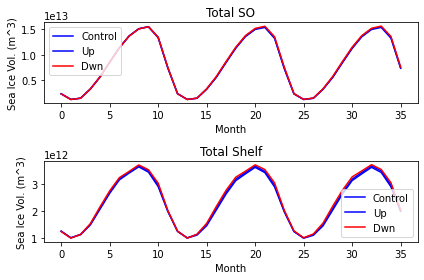

In [54]:
#compare with Fig 27 of Kiss et al: https://paulspence.github.io/files/gmd-13-401-2020.pdf

plt.subplot(211)
plt.plot(yrs,siv_con_so,linestyle='-',color='b',label='Control',linewidth=1.5)
plt.plot(yrs,siv_up_so,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_so,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Month')
#plt.xlim([-75,85])
plt.title('Total SO')
plt.legend(fontsize=10)

plt.subplot(212)
plt.plot(yrs,siv_con_shelf,linestyle='-',color='b',label='Control',linewidth=1.5)
plt.plot(yrs,siv_up_shelf,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Month')
#plt.xlim([-75,85])
plt.title('Total Shelf')
plt.legend(fontsize=10)

plt.tight_layout()

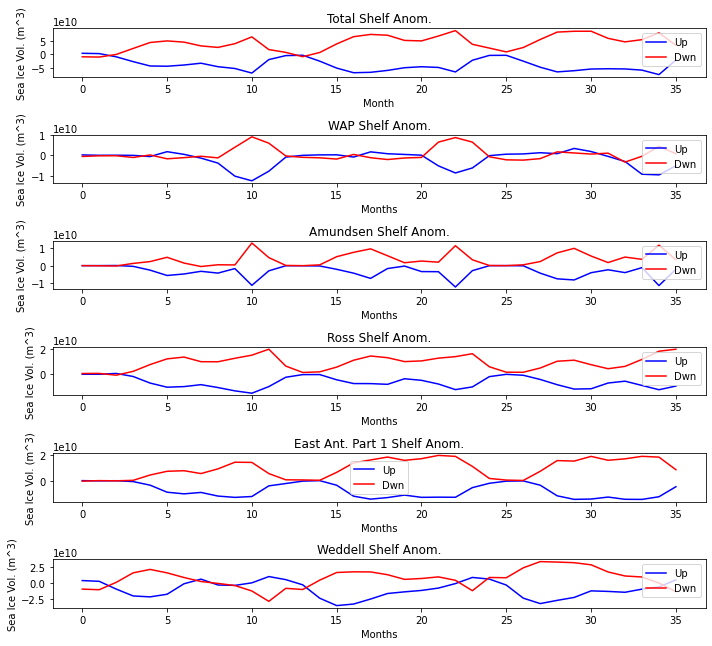

In [55]:
yrs=np.arange(0,36,1)
fig = plt.figure(figsize=(10, 9))

plt.subplot(611)
plt.plot(yrs,siv_up_shelf-siv_con_shelf,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_shelf-siv_con_shelf,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Month')
#plt.xlim([-75,85])
plt.title('Total Shelf Anom.')
plt.legend(fontsize=10)

plt.subplot(612)
plt.plot(yrs,siv_up_wapsh-siv_con_wapsh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_wapsh-siv_con_wapsh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Months')
#plt.xlim([-75,85])
plt.title('WAP Shelf Anom.')
plt.legend(fontsize=10)


plt.subplot(613)
plt.plot(yrs,siv_up_assh-siv_con_assh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_assh-siv_con_assh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Months')
#plt.xlim([-75,85])
plt.title('Amundsen Shelf Anom.')
plt.legend(fontsize=10)

plt.subplot(614)
plt.plot(yrs,siv_up_rossh-siv_con_rossh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_rossh-siv_con_rossh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Months')
#plt.xlim([-75,85])
plt.title('Ross Shelf Anom.')
plt.legend(fontsize=10)

plt.subplot(615)
plt.plot(yrs,siv_up_ea1sh-siv_con_ea1sh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_ea1sh-siv_con_ea1sh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Months')
#plt.xlim([-75,85])
plt.title('East Ant. Part 1 Shelf Anom.')
plt.legend(fontsize=10)

plt.subplot(616)
plt.plot(yrs,siv_up_wedsh-siv_con_wedsh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_wedsh-siv_con_wedsh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Months')
#plt.xlim([-75,85])
plt.title('Weddell Shelf Anom.')
plt.legend(fontsize=10)

plt.tight_layout()

In [40]:
#calc ice volume anomalies in different sectors
start_time='2150-01-01'
end_time='2164-12-31'

lat_slice  = slice(-80,-50)

In [41]:
hi_m_con=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_con=hi_m_con.sel(time=slice(start_time,end_time)).resample(time='Y').mean('time')
hi_m_con

ai_m_con=getACCESSdata(var='aice_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
ai_m_con=ai_m_con.sel(time=slice(start_time,end_time)).resample(time='Y').mean('time')
ai_m_con

<xarray.DataArray 'aice_m' (time: 15, yt_ocean: 740, xt_ocean: 3600)>
dask.array<stack, shape=(15, 740, 3600), dtype=float32, chunksize=(1, 675, 900), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2164-12-31 00:00:00
    TLON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    TLAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04

In [42]:
siv_con=hi_m_con*ai_m_con.load()
siv_con_shelf=siv_con.where(shmask.shmask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_wapsh=siv_con.where(wap_mask.wap_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_bssh=siv_con.where(bs_mask.bs_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_assh=siv_con.where(as_mask2.as_mask2).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_rossh=siv_con.where(ros_mask.ros_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_ea1sh=siv_con.where(ea1_mask.ea1_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_ea2sh=siv_con.where(ea2_mask.ea2_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_con_wedsh=siv_con.where(wed_mask.wed_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [43]:
hi_m_up=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_up = hi_m_up.sel(time=slice(start_time,end_time)).resample(time='Y').mean('time')#.sel(TLAT=lat_slice)
hi_m_up = hi_m_up.load()

ai_m_up=getACCESSdata(var='aice_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
ai_m_up=ai_m_con.sel(time=slice(start_time,end_time)).resample(time='Y').mean('time')
ai_m_up

<xarray.DataArray 'aice_m' (time: 15, yt_ocean: 740, xt_ocean: 3600)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]], dtype=float32)
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2164-12-31 00:00:00
    TLON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.75 79.85 79.95
    TLAT      (yt_ocean, xt_ocean) float32 nan nan nan ... -45.04 -45.04 -45.04
    ULON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.8 79.9 80.0
    ULAT      (yt_ocean, xt_ocean) float32 nan nan nan nan ... -45.0 -45.0 -45.0
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04

In [44]:
siv_up=hi_m_up*ai_m_up.load()

siv_up_shelf=siv_up.where(shmask.shmask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_wapsh=siv_up.where(wap_mask.wap_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_bssh=siv_up.where(bs_mask.bs_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_assh=siv_up.where(as_mask2.as_mask2).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_rossh=siv_up.where(ros_mask.ros_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_ea1sh=siv_up.where(ea1_mask.ea1_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_ea2sh=siv_up.where(ea2_mask.ea2_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_up_wedsh=siv_up.where(wed_mask.wed_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()

In [45]:
hi_m_dwn=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_dwn = hi_m_dwn.sel(time=slice(start_time,end_time)).resample(time='Y').mean('time')#.sel(TLAT=lat_slice)
hi_m_dwn = hi_m_dwn.load()

ai_m_dwn=getACCESSdata(var='aice_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
ai_m_dwn=ai_m_dwn.sel(time=slice(start_time,end_time)).resample(time='Y').mean('time')
ai_m_dwn

<xarray.DataArray 'aice_m' (time: 15, yt_ocean: 740, xt_ocean: 3600)>
dask.array<stack, shape=(15, 740, 3600), dtype=float32, chunksize=(1, 675, 900), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2164-12-31 00:00:00
    TLON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    TLAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULON      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
    ULAT      (yt_ocean, xt_ocean) float32 dask.array<chunksize=(675, 900), meta=np.ndarray>
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04

In [46]:
siv_dwn=hi_m_dwn*ai_m_dwn.load()

In [47]:
siv_dwn_shelf=siv_dwn.where(shmask.shmask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_wapsh=siv_dwn.where(wap_mask.wap_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_bssh=siv_dwn.where(bs_mask.bs_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_assh=siv_dwn.where(as_mask2.as_mask2).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_rossh=siv_dwn.where(ros_mask.ros_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_ea1sh=siv_dwn.where(ea1_mask.ea1_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_ea2sh=siv_dwn.where(ea2_mask.ea2_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()
siv_dwn_wedsh=siv_dwn.where(wed_mask.wed_mask).weighted(area_t).sum(dim=('xt_ocean','yt_ocean')).compute()

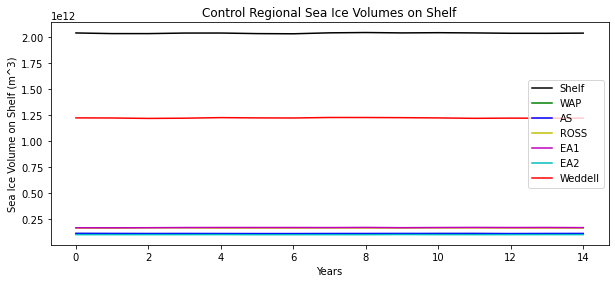

In [48]:
yrs=np.arange(0,15,1)
fig = plt.figure(figsize=(10, 9))

plt.subplot(211)
plt.plot(yrs,siv_con_shelf,linestyle='-',color='k',label='Shelf',linewidth=1.5)
plt.plot(yrs,siv_con_wapsh,linestyle='-',color='g',label='WAP',linewidth=1.5)
plt.plot(yrs,siv_con_assh,linestyle='-',color='b',label='AS',linewidth=1.5)
plt.plot(yrs,siv_con_rossh,linestyle='-',color='y',label='ROSS',linewidth=1.5)
plt.plot(yrs,siv_con_ea1sh,linestyle='-',color='m',label='EA1',linewidth=1.5)
plt.plot(yrs,siv_con_ea2sh,linestyle='-',color='c',label='EA2',linewidth=1.5)
plt.plot(yrs,siv_con_wedsh,linestyle='-',color='r',label='Weddell',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Volume on Shelf (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Control Regional Sea Ice Volumes on Shelf')
plt.legend(fontsize=10)

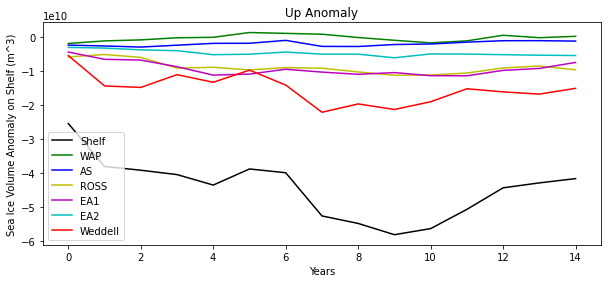

In [49]:
yrs=np.arange(0,15,1)
fig = plt.figure(figsize=(10, 9))

plt.subplot(211)
plt.plot(yrs,siv_up_shelf-siv_con_shelf,linestyle='-',color='k',label='Shelf',linewidth=1.5)
plt.plot(yrs,siv_up_wapsh-siv_con_wapsh,linestyle='-',color='g',label='WAP',linewidth=1.5)
plt.plot(yrs,siv_up_assh-siv_con_assh,linestyle='-',color='b',label='AS',linewidth=1.5)
plt.plot(yrs,siv_up_rossh-siv_con_rossh,linestyle='-',color='y',label='ROSS',linewidth=1.5)
plt.plot(yrs,siv_up_ea1sh-siv_con_ea1sh,linestyle='-',color='m',label='EA1',linewidth=1.5)
plt.plot(yrs,siv_up_ea2sh-siv_con_ea2sh,linestyle='-',color='c',label='EA2',linewidth=1.5)
plt.plot(yrs,siv_up_wedsh-siv_con_wedsh,linestyle='-',color='r',label='Weddell',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Volume Anomaly on Shelf (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Up Anomaly')
plt.legend(fontsize=10)

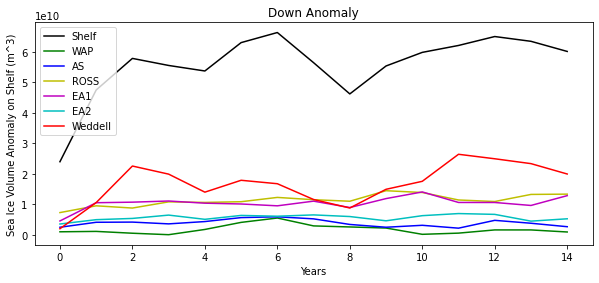

In [50]:
yrs=np.arange(0,15,1)
fig = plt.figure(figsize=(10, 9))

plt.subplot(211)
plt.plot(yrs,siv_dwn_shelf-siv_con_shelf,linestyle='-',color='k',label='Shelf',linewidth=1.5)
plt.plot(yrs,siv_dwn_wapsh-siv_con_wapsh,linestyle='-',color='g',label='WAP',linewidth=1.5)
plt.plot(yrs,siv_dwn_assh-siv_con_assh,linestyle='-',color='b',label='AS',linewidth=1.5)
plt.plot(yrs,siv_dwn_rossh-siv_con_rossh,linestyle='-',color='y',label='ROSS',linewidth=1.5)
plt.plot(yrs,siv_dwn_ea1sh-siv_con_ea1sh,linestyle='-',color='m',label='EA1',linewidth=1.5)
plt.plot(yrs,siv_dwn_ea2sh-siv_con_ea2sh,linestyle='-',color='c',label='EA2',linewidth=1.5)
plt.plot(yrs,siv_dwn_wedsh-siv_con_wedsh,linestyle='-',color='r',label='Weddell',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Volume Anomaly on Shelf (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Down Anomaly')
plt.legend(fontsize=10)

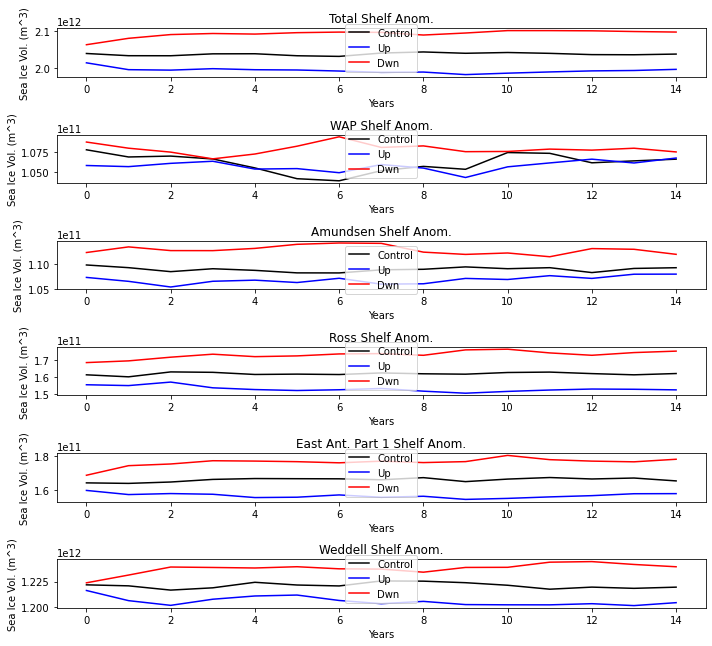

In [51]:
# yrs=np.arange(0,15,1)
fig = plt.figure(figsize=(10, 9))

plt.subplot(611)
plt.plot(yrs,siv_con_shelf,linestyle='-',color='k',label='Control',linewidth=1.5)
plt.plot(yrs,siv_up_shelf,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Total Shelf Anom.')
plt.legend(fontsize=10)

plt.subplot(612)
plt.plot(yrs,siv_con_wapsh,linestyle='-',color='k',label='Control',linewidth=1.5)
plt.plot(yrs,siv_up_wapsh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_wapsh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('WAP Shelf Anom.')
plt.legend(fontsize=10)


plt.subplot(613)
plt.plot(yrs,siv_con_assh,linestyle='-',color='k',label='Control',linewidth=1.5)
plt.plot(yrs,siv_up_assh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_assh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Amundsen Shelf Anom.')
plt.legend(fontsize=10)

plt.subplot(614)
plt.plot(yrs,siv_con_rossh,linestyle='-',color='k',label='Control',linewidth=1.5)
plt.plot(yrs,siv_up_rossh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_rossh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Ross Shelf Anom.')
plt.legend(fontsize=10)

plt.subplot(615)
plt.plot(yrs,siv_con_ea1sh,linestyle='-',color='k',label='Control',linewidth=1.5)
plt.plot(yrs,siv_up_ea1sh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_ea1sh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('East Ant. Part 1 Shelf Anom.')
plt.legend(fontsize=10)

plt.subplot(616)
plt.plot(yrs,siv_con_wedsh,linestyle='-',color='k',label='Control',linewidth=1.5)
plt.plot(yrs,siv_up_wedsh,linestyle='-',color='b',label='Up',linewidth=1.5)
plt.plot(yrs,siv_dwn_wedsh,linestyle='-',color='r',label='Dwn',linewidth=1.5)
#plt.plot(yrs,siv_up_shelf,linestyle='-',color='r',label='Up',linewidth=1.5)
#plt.plot(yrs,siv_dwn_shelf,linestyle='-',color='b',label='Down',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Sea Ice Vol. (m^3)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Weddell Shelf Anom.')
plt.legend(fontsize=10)

plt.tight_layout()

In [ ]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

#anom=temp.where(tmask.tmask).sel(st_ocean=(200,700)).mean(dim='st_ocean')
#t=temp.isel(st_ocean=0)


p1 = ltm_temp_zavg.where(mb_mask.mb_mask).plot.pcolormesh(x='xt_ocean', y='yt_ocean', vmin=271, vmax=274, add_colorbar=False, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

#p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx73.values-decavg73_tx.values, ty73.values-decavg73_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('Mask Sea Ice')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');



In [24]:
# plot anomalies for last 5 years of simulation:
#start_time='2150-01-01'
start_time='2160-01-01'
end_time='2164-12-31'

lat_slice  = slice(-80,-50)

hi_m=cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='hi_m', 
                          session=master_session, frequency='1 monthly',
                          start_time='2150-01-31 00:00:00', 
                          end_time='2164-12-31 00:00:00')
hi_m = hi_m.sel(time=slice(start_time,end_time)).mean('time')#.sel(TLAT=lat_slice)
hi_m=hi_m.load()

In [25]:
hi_m_con=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_con = hi_m_con.sel(time=slice(start_time,end_time)).mean('time')#.sel(TLAT=lat_slice)
hi_m_con = hi_m_con.load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [26]:
ai_m_con=getACCESSdata(var='aice_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
ai_m_con = ai_m_con.sel(time=slice(start_time,end_time)).mean('time')#.sel(TLAT=lat_slice)
ai_m_con = ai_m_con.load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [ ]:
hi_m_up=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_up = hi_m_up.sel(time=slice(start_time,end_time)).mean('time')#.sel(TLAT=lat_slice)
hi_m_up = hi_m_up.load()

In [ ]:
hi_m_dwn=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_dwn = hi_m_dwn.sel(time=slice(start_time,end_time)).mean('time')#.sel(TLAT=lat_slice)
hi_m_dwn = hi_m_dwn.load()

In [ ]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(20, 18))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

#plt.gca().patch.set_color('.5')

ax = plt.subplot(1, 1, 1, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
#ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
#ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
# isel(st_ocean=(37))

p1 = ai_m_con.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, cmap=plt.cm.BuPu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

plt.title('Control Ice Area',fontsize=16)

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1, orientation='vertical', extend='both',fontsize=16)
cb.ax.set_xlabel('m2');


ValueError: ('yt_ocean', 'xt_ocean') must be a permuted list of ('time', 'yt_ocean', 'xt_ocean'), unless `...` is included

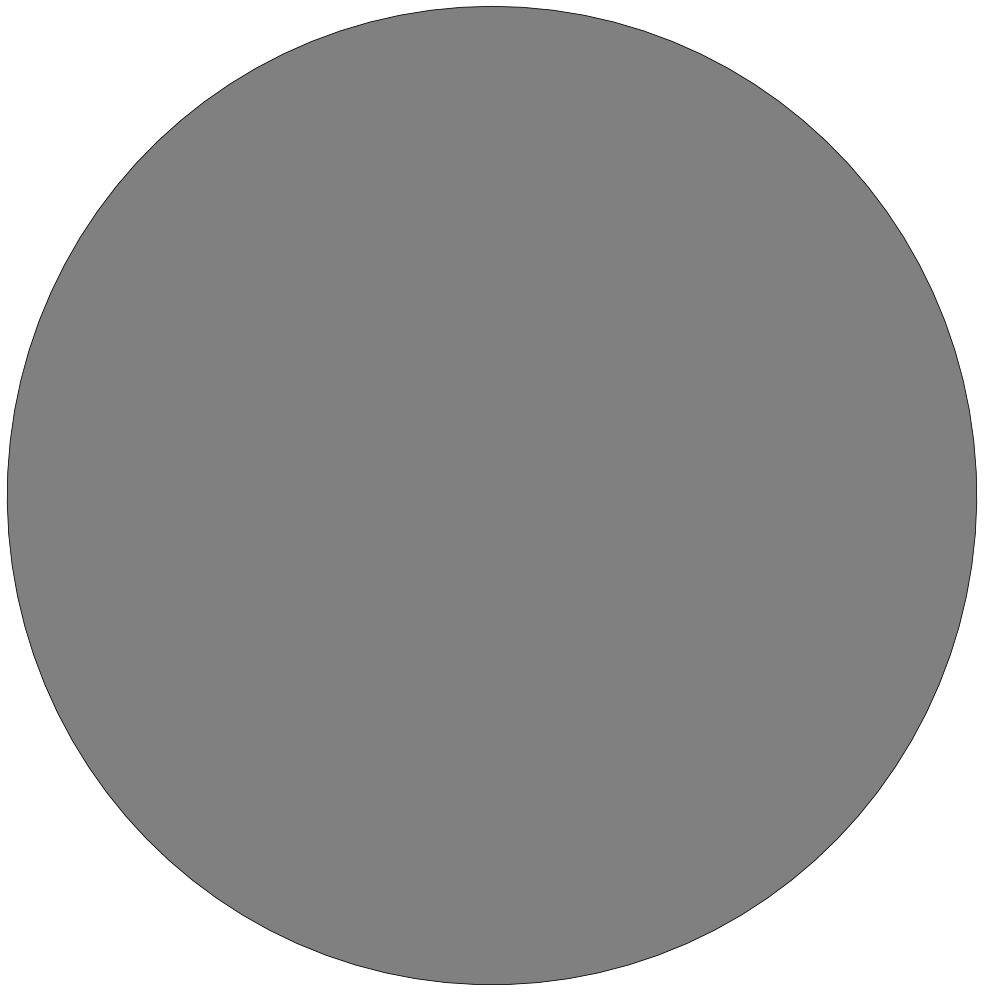

In [22]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(20, 18))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

#plt.gca().patch.set_color('.5')

ax = plt.subplot(1, 1, 1, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
#ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
#ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
# isel(st_ocean=(37))

p1 = hi_m_con.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=0, vmax=2, add_colorbar=False, cmap=plt.cm.BuPu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

plt.title('Control Ice Thickness',fontsize=16)

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1, orientation='vertical', extend='both',fontsize=16)
cb.ax.set_xlabel('m');



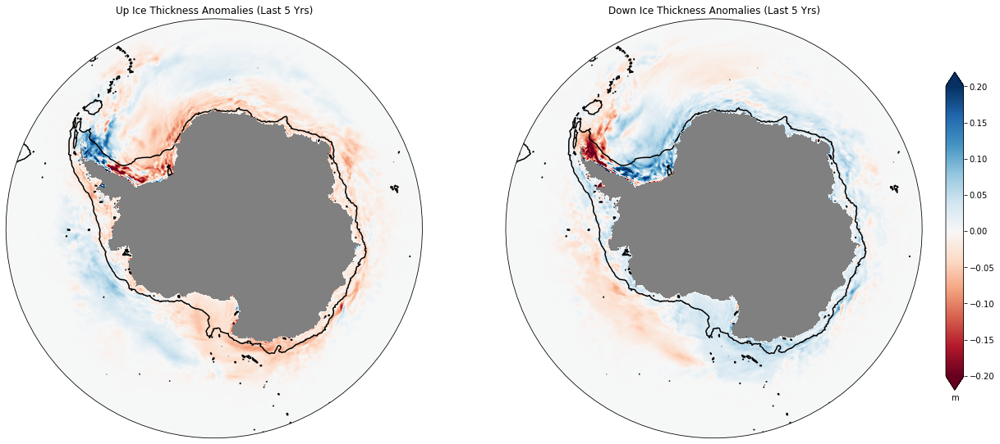

In [19]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(20, 18))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 2, 1, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
#ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
#ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
# isel(st_ocean=(37))

a=hi_m_up-hi_m_con

p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.2, vmax=.2, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

plt.title('Up Ice Thickness Anomalies (Last 5 Yrs)')

ax = plt.subplot(1, 2, 2, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
#ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
#ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
# isel(st_ocean=(37))

a=hi_m_dwn-hi_m_con

p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.2, vmax=.2, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())
plt.title('Down Ice Thickness Anomalies (Last 5 Yrs)')

#rect = [left, bottom, width, height]
ax_cb = plt.axes([0.92, 0.35, 0.015, 0.3])
cb = plt.colorbar(p1,cax=ax_cb,orientation='vertical', extend='both',shrink=0.5)
cb.ax.set_xlabel('m');

#plt.tight_layout()

In [20]:
#plot anomalies over first few years
start_time='2150-01-01'
end_time='2154-12-31'

hi_m_up=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_up = hi_m_up.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_up.load()

hi_m_dwn=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_dwn = hi_m_dwn.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_dwn.load()

hi_m_con=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_con = hi_m_con.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_con.load()

<xarray.DataArray 'hi_m' (time: 5, yt_ocean: 740, xt_ocean: 3600)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]], dtype=float32)
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2154-12-31 00:00:00
    TLON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.75 79.85 79.95
    TLAT      (yt_ocean, xt_ocean) float32 nan nan nan ... -45.04 -45.04 -45.04
    ULON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.8 79.9 80.0
    ULAT      (yt_ocean, xt_ocean) float32 nan nan nan nan ... -45.0 -45.0 -45.0
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04

(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)


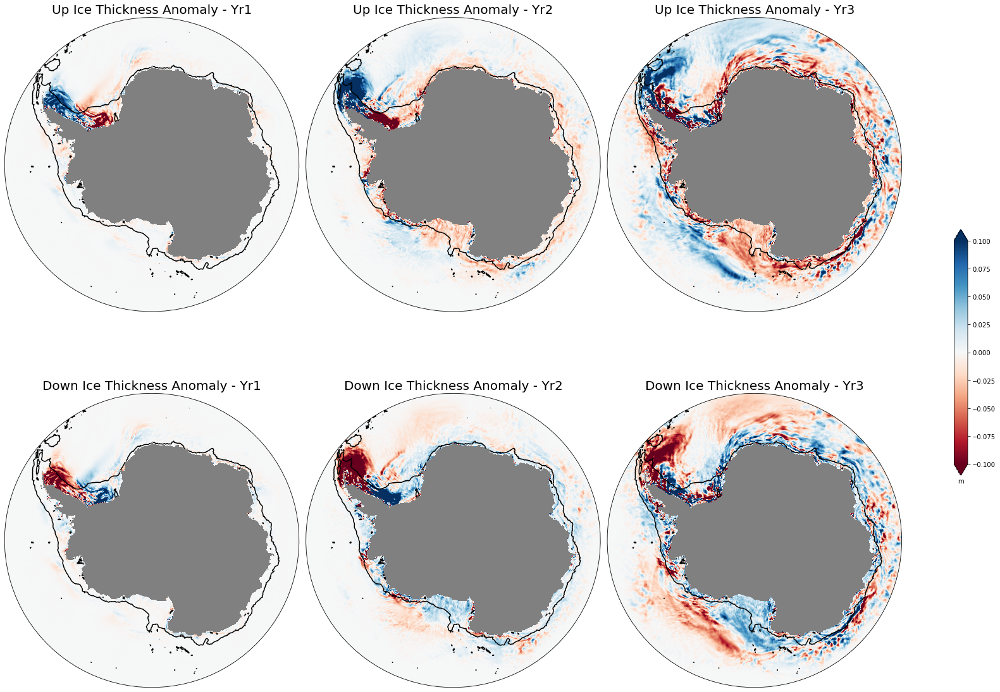

In [25]:
fig = plt.figure(figsize=(20, 18))

for t in range(0,3):
    
    projection=ccrs.SouthPolarStereo()
    ax = plt.subplot(2,3,t+1, projection=projection)
    ax.patch.set_color('.5')

    ax.set_extent([-280, 80, -80, -60], crs=ccrs.PlateCarree())
    #ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
    #ax.coastlines(resolution='50m')

    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    a=hi_m_up[t]-hi_m_con[t]
    print(a.shape)
    
    p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
    p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

    tit='Up Ice Thickness Anomaly - Yr'+str(t+1)
    plt.title(tit,fontsize = 20)
    
    projection=ccrs.SouthPolarStereo()
    ax = plt.subplot(2,3,t+4, projection=projection)
    ax.patch.set_color('.5')

    ax.set_extent([-280, 80, -80, -60], crs=ccrs.PlateCarree())
    #ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
    #ax.coastlines(resolution='50m')

    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    a=hi_m_dwn[t]-hi_m_con[t]
    print(a.shape)
    
    p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
    p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

    tit='Down Ice Thickness Anomaly - Yr'+str(t+1)
    plt.title(tit,fontsize = 20)

#rect = [left, bottom, width, height]
ax_cb = plt.axes([1.05, 0.35, 0.015, 0.3])
cb = plt.colorbar(p1,cax=ax_cb,orientation='vertical', extend='both', shrink=0.5, size = 20)
cb.ax.set_xlabel('m');
    
plt.tight_layout()


/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)


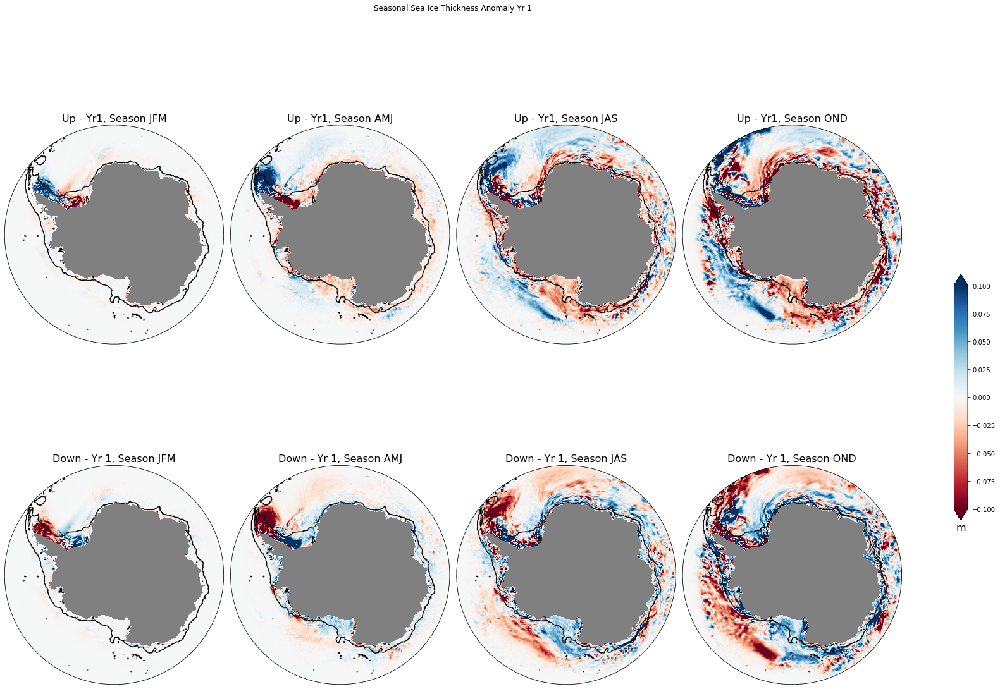

In [10]:
#plot seasonal ice anomalies over first year
start_time='2150-01-01'
end_time='2150-12-31'
seas=['JFM', 'AMJ', 'JAS','OND']

hi_m_up=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_up = hi_m_up.sel(time=slice(start_time,end_time)).resample({'time':'QS-JAN'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_up.load()

hi_m_dwn=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_dwn = hi_m_dwn.sel(time=slice(start_time,end_time)).resample({'time':'QS-JAN'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_dwn.load()

hi_m_con=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_con = hi_m_con.sel(time=slice(start_time,end_time)).resample({'time':'QS-JAN'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_con.load()



(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)


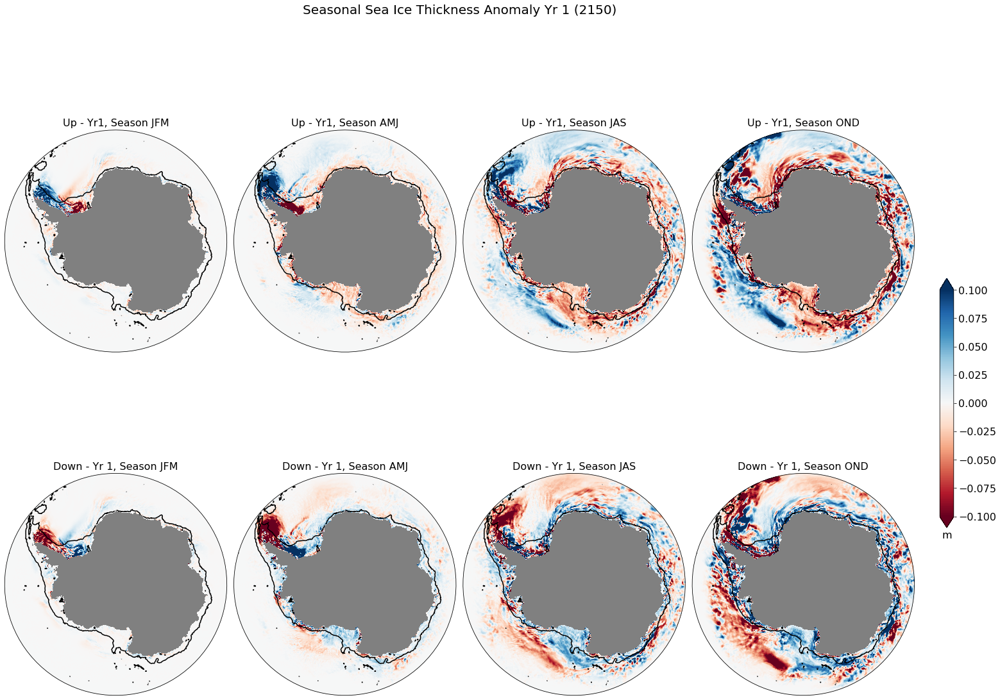

In [12]:
fig = plt.figure(figsize=(20, 18))
plt.suptitle('Seasonal Sea Ice Thickness Anomaly Yr 1 (2150)', fontsize=20)


for t in range(0,4):
    
    projection=ccrs.SouthPolarStereo()
    ax = plt.subplot(2,4,t+1, projection=projection)
    ax.patch.set_color('.5')

    ax.set_extent([-280, 80, -80, -60], crs=ccrs.PlateCarree())
    #ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
    #ax.coastlines(resolution='50m')

    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    a=hi_m_up[t]-hi_m_con[t]
    print(a.shape)
    
    p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
    p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

    tit='Up - Yr1, Season '+seas[t]
    plt.title(tit,fontsize = 16)
    
    projection=ccrs.SouthPolarStereo()
    ax = plt.subplot(2,4,t+5, projection=projection)
    ax.patch.set_color('.5')

    ax.set_extent([-280, 80, -80, -60], crs=ccrs.PlateCarree())
    #ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
    #ax.coastlines(resolution='50m')

    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    a=hi_m_dwn[t]-hi_m_con[t]
    print(a.shape)
    
    p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
    p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

    tit='Down - Yr 1, Season '+seas[t]
    plt.title(tit,fontsize = 16)

ax_cb = plt.axes([1.02, 0.35, 0.015, 0.3])
cb = plt.colorbar(p1,cax=ax_cb,orientation='vertical', extend='both', shrink=0.5)
cb.ax.set_xlabel('m',fontsize=16);
cb.ax.tick_params(labelsize=16) 
plt.tight_layout()


In [13]:
#plot anomalies over first 5 years
start_time='2150-01-01'
end_time='2152-12-31'

fr_m_up=getACCESSdata(var='frazil_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
fr_m_up = fr_m_up.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
fr_m_up.load()

fr_m_dwn=getACCESSdata(var='frazil_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
fr_m_dwn = fr_m_dwn.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
fr_m_dwn.load()

fr_m_con=getACCESSdata(var='frazil_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
fr_m_con = fr_m_con.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
fr_m_con.load()

<xarray.DataArray 'frazil_m' (time: 3, yt_ocean: 740, xt_ocean: 3600)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]], dtype=float32)
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2152-12-31 00:00:00
    TLON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.75 79.85 79.95
    TLAT      (yt_ocean, xt_ocean) float32 nan nan nan ... -45.04 -45.04 -45.04
    ULON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.8 79.9 80.0
    ULAT      (yt_ocean, xt_ocean) float32 nan nan nan nan ... -45.0 -45.0 -45.0
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04

(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)
(740, 3600)


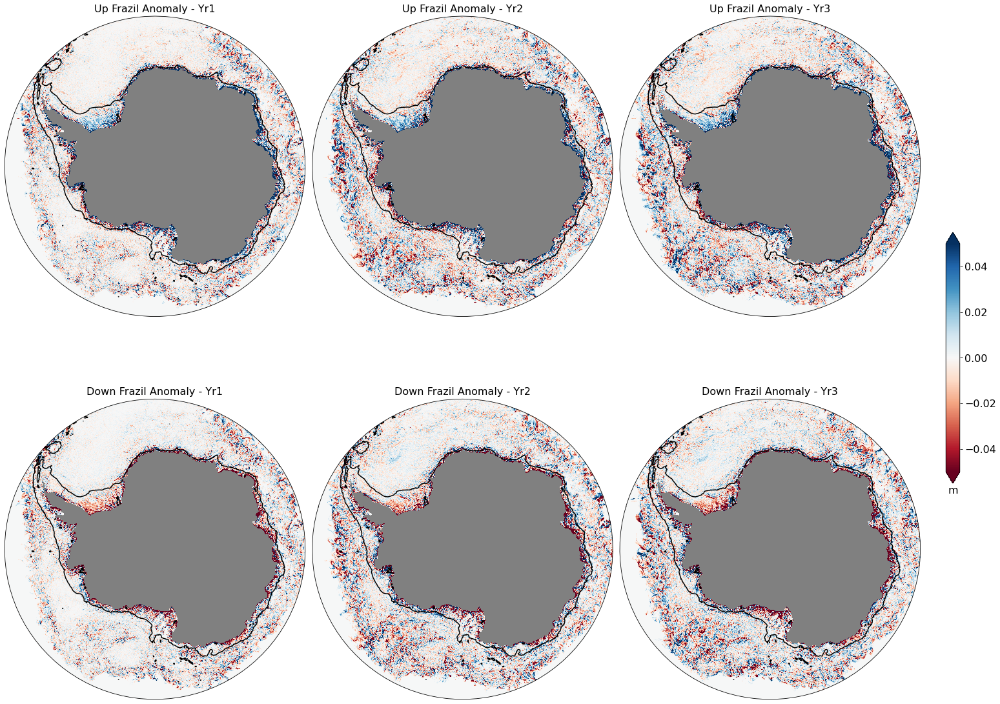

In [16]:
fig = plt.figure(figsize=(20, 18))

for t in range(0,3):
    
    projection=ccrs.SouthPolarStereo()
    ax = plt.subplot(2,3,t+1, projection=projection)
    ax.patch.set_color('.5')

    ax.set_extent([-280, 80, -80, -60], crs=ccrs.PlateCarree())
    #ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
    #ax.coastlines(resolution='50m')

    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    a=fr_m_up[t]-fr_m_con[t]
    print(a.shape)
    
    p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.05, vmax=.05, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
    p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

    tit='Up Frazil Anomaly - Yr'+str(t+1)
    plt.title(tit,fontsize=16)
    
    projection=ccrs.SouthPolarStereo()
    ax = plt.subplot(2,3,t+4, projection=projection)
    ax.patch.set_color('.5')

    ax.set_extent([-280, 80, -80, -60], crs=ccrs.PlateCarree())
    #ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
    #ax.coastlines(resolution='50m')

    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    a=fr_m_dwn[t]-fr_m_con[t]
    print(a.shape)
    
    p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.05, vmax=.05, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
    p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

    tit='Down Frazil Anomaly - Yr'+str(t+1)
    plt.title(tit,fontsize=16)
    
ax_cb = plt.axes([1.02, 0.35, 0.015, 0.3])
cb = plt.colorbar(p1,cax=ax_cb,orientation='vertical', extend='both', shrink=0.5)
cb.ax.set_xlabel('m',fontsize=16);
cb.ax.tick_params(labelsize=16) 
plt.tight_layout()


In [11]:
start_time='2150-01-01'
end_time='2152-12-31'

hi_m_up=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_up = hi_m_up.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_up.load()

hi_m_dwn=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_dwn = hi_m_dwn.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_dwn.load()

hi_m_con=getACCESSdata(var='hi_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
hi_m_con = hi_m_con.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
hi_m_con.load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


<xarray.DataArray 'hi_m' (time: 3, yt_ocean: 740, xt_ocean: 3600)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]], dtype=float32)
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2152-12-31 00:00:00
    TLON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.75 79.85 79.95
    TLAT      (yt_ocean, xt_ocean) float32 nan nan nan ... -45.04 -45.04 -45.04
    ULON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.8 79.9 80.0
    ULAT      (yt_ocean, xt_ocean) float32 nan nan nan nan ... -45.0 -45.0 -45.0
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04

In [10]:
#plot ice vel anomalies over first few years
start_time='2150-01-01'
end_time='2152-12-31'

uvel_up=getACCESSdata(var='uvel_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
uvel_up = uvel_up.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
uvel_up.load()

vvel_up=getACCESSdata(var='vvel_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
vvel_up = vvel_up.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
vvel_up.load()

uvel_dwn=getACCESSdata(var='uvel_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
uvel_dwn = uvel_dwn.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
uvel_dwn.load()

vvel_dwn=getACCESSdata(var='vvel_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
vvel_dwn = vvel_dwn.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
vvel_dwn.load()

uvel_con=getACCESSdata(var='uvel_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
uvel_con = uvel_con.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
uvel_con.load()

vvel_con=getACCESSdata(var='vvel_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
vvel_con = vvel_con.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
vvel_con.load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


<xarray.DataArray 'vvel_m' (time: 3, yt_ocean: 740, xt_ocean: 3600)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]], dtype=float32)
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2152-12-31 00:00:00
    TLON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.75 79.85 79.95
    TLAT      (yt_ocean, xt_ocean) float32 nan nan nan ... -45.04 -45.04 -45.04
    ULON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.8 79.9 80.0
    ULAT      (yt_ocean, xt_ocean) float32 nan nan nan nan ... -45.0 -45.0 -45.0
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04

start_time='2150-01-01'
end_time='2150-12-31'

uvel_up=getACCESSdata(var='uvel_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
uvel_up = uvel_up.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
uvel_up.load()

In [16]:

uvel_up[0].values

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]], dtype=float32)

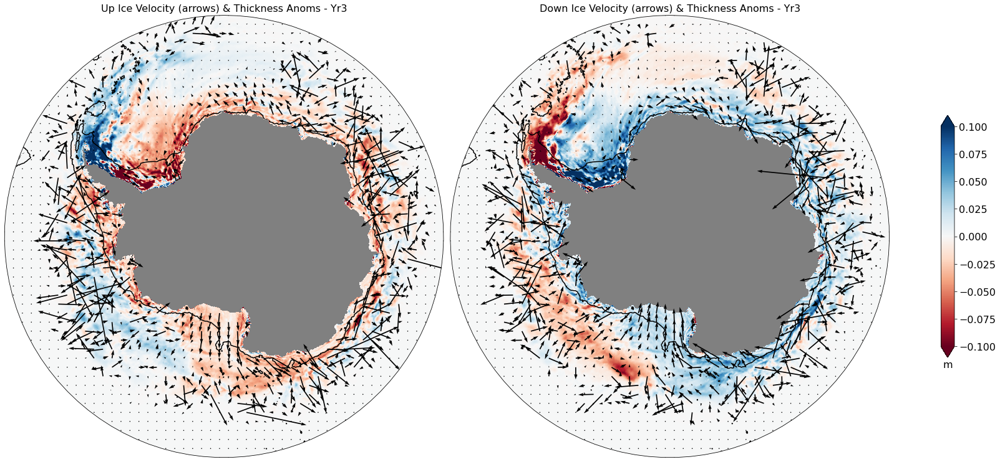

In [35]:
t=2
fig = plt.figure(figsize=(20, 18))
    
projection=ccrs.SouthPolarStereo()

ax = plt.subplot(1,2,1, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

a=hi_m_up[t]-hi_m_con[t]
    
p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

av=vvel_up[t]-vvel_con[t]
au=uvel_up[t]-uvel_con[t]

p2=ax.quiver(xt_ocean.values, yt_ocean[0:740].values, au.values, av.values,regrid_shape=50,transform=ccrs.PlateCarree())

tit='Up Ice Velocity (arrows) & Thickness Anoms - Yr'+str(t+1)
plt.title(tit,fontsize = 16)

ax = plt.subplot(1,2,2, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

a=hi_m_dwn[t]-hi_m_con[t]
    
p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

av=vvel_dwn[t]-vvel_con[t]
au=uvel_dwn[t]-uvel_con[t]

p2=ax.quiver(xt_ocean.values, yt_ocean[0:740].values, au.values, av.values,regrid_shape=50,transform=ccrs.PlateCarree())

tit='Down Ice Velocity (arrows) & Thickness Anoms - Yr'+str(t+1)
plt.title(tit,fontsize = 16)

#rect = [left, bottom, width, height]
ax_cb = plt.axes([1.05, 0.35, 0.015, 0.3])
cb = plt.colorbar(p1,cax=ax_cb,orientation='vertical', extend='both', shrink=0.5)
cb.ax.set_xlabel('m',fontsize=16);
cb.ax.tick_params(labelsize=16) 
    
plt.tight_layout()

In [12]:
start_time='2150-01-01'
end_time='2152-12-31'

strairx_up=getACCESSdata(var='strairx_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
strairx_up = strairx_up.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
strairx_up.load()

strairy_up=getACCESSdata(var='strairy_m',start=start_time,end=end_time,exp=easterlies_up,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
strairy_up = strairy_up.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
strairy_up.load()

strairx_dwn=getACCESSdata(var='strairx_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
strairx_dwn = strairx_dwn.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
strairx_dwn.load()

strairy_dwn=getACCESSdata(var='strairy_m',start=start_time,end=end_time,exp=easterlies_down,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
strairy_dwn = strairy_dwn.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
strairy_dwn.load()

strairx_con=getACCESSdata(var='strairx_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
strairx_con = strairx_con.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
strairx_con.load()

strairy_con=getACCESSdata(var='strairy_m',start=start_time,end=end_time,exp=control,freq='1 monthly',ses=master_session, minlon=geolon_t.xt_ocean.values.min(),maxlon=geolon_t.xt_ocean.values.max())
strairy_con = strairy_con.sel(time=slice(start_time,end_time)).resample({'time':'Y'}).mean('time')#.sel(TLAT=lat_slice)
strairy_con.load()

<xarray.DataArray 'strairy_m' (time: 3, yt_ocean: 740, xt_ocean: 3600)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]], dtype=float32)
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2152-12-31 00:00:00
    TLON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.75 79.85 79.95
    TLAT      (yt_ocean, xt_ocean) float32 nan nan nan ... -45.04 -45.04 -45.04
    ULON      (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.8 79.9 80.0
    ULAT      (yt_ocean, xt_ocean) float32 nan nan nan nan ... -45.0 -45.0 -45.0
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -45.18 -45.11 -45.04

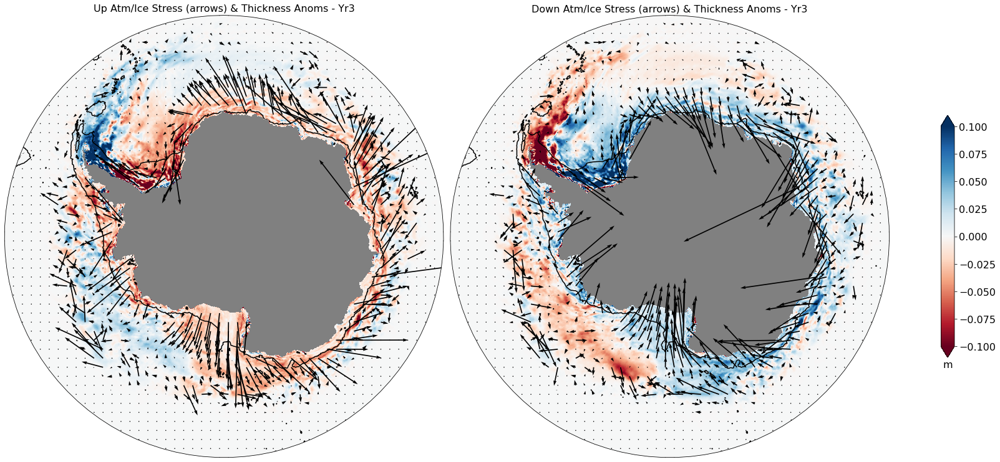

In [13]:
t=2
fig = plt.figure(figsize=(20, 18))
    
projection=ccrs.SouthPolarStereo()

ax = plt.subplot(1,2,1, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

a=hi_m_up[t]-hi_m_con[t]
    
p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

av=strairy_up[t]-strairy_con[t]
au=strairx_up[t]-strairx_con[t]

p2=ax.quiver(xt_ocean.values, yt_ocean[0:740].values, au.values, av.values,regrid_shape=50,transform=ccrs.PlateCarree())

tit='Up Atm/Ice Stress (arrows) & Thickness Anoms - Yr'+str(t+1)
plt.title(tit,fontsize = 16)

ax = plt.subplot(1,2,2, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

a=hi_m_dwn[t]-hi_m_con[t]
    
p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

av=strairy_dwn[t]-strairy_con[t]
au=strairx_dwn[t]-strairx_con[t]

p2=ax.quiver(xt_ocean.values, yt_ocean[0:740].values, au.values, av.values,regrid_shape=50,transform=ccrs.PlateCarree())

tit='Down Atm/Ice Stress (arrows) & Thickness Anoms - Yr'+str(t+1)
plt.title(tit,fontsize = 16)

#rect = [left, bottom, width, height]
ax_cb = plt.axes([1.05, 0.35, 0.015, 0.3])
cb = plt.colorbar(p1,cax=ax_cb,orientation='vertical', extend='both', shrink=0.5)
cb.ax.set_xlabel('m',fontsize=16);
cb.ax.tick_params(labelsize=16) 
    
plt.tight_layout()

In [ ]:
#masks for sea ice volume anomalies


In [14]:
#ht = cc.querying.getvar('01deg_jra55v140_iaf','ht',master_session,n=1).sel(yt_ocean=slice(-90,-55))
start='2150-01-01'
end='2152-12-31'

taux_up = cc.querying.getvar(expt=easterlies_up, variable='tau_x', 
                       session=master_session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).sel(yu_ocean = slice(-90, -45)).resample({'time':'Y'}).mean('time')
taux_up
taux_up.load()

tauy_up = cc.querying.getvar(expt=easterlies_up, variable='tau_y', 
                       session=master_session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).sel(yu_ocean = slice(-90, -45)).resample({'time':'Y'}).mean('time')
tauy_up.load()

taux_dwn = cc.querying.getvar(expt=easterlies_down, variable='tau_x', 
                       session=master_session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).sel(yu_ocean = slice(-90, -45)).resample({'time':'Y'}).mean('time')
taux_dwn.load()

tauy_dwn = cc.querying.getvar(expt=easterlies_down, variable='tau_y', 
                       session=master_session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).sel(yu_ocean = slice(-90, -45)).resample({'time':'Y'}).mean('time')
tauy_dwn.load()

taux_con = cc.querying.getvar(expt=control, variable='tau_x', 
                       session=master_session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).sel(yu_ocean = slice(-90, -45)).resample({'time':'Y'}).mean('time')
taux_con.load()

tauy_con = cc.querying.getvar(expt=control, variable='tau_y', 
                       session=master_session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).sel(yu_ocean = slice(-90, -45)).resample({'time':'Y'}).mean('time')
tauy_con.load()





/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, 

<xarray.DataArray 'tau_y' (time: 3, yu_ocean: 740, xu_ocean: 3600)>
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-0.01004681, -0.00968791, -0.00945052, ..., -0.01067134,
         -0.01060177, -0.01040298],
        [-0.01035718, -0.01003225, -0.00978723, ..., -0.01095506,
         -0.01085026, -0.01064904],
        [-0.01064335, -0.01037362, -0.01020152, ..., -0.01129002,
         -0.01112382, -0.01089745]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [-0.01611349, -0.01614011, -0.016047  , ..., -0.01559682,
         -0.01584333, -0.01604284],
        [-0.0160459 , -0.01605595, -0.01595356, ..., -0.01569748,
         -0.01585181, -0.01599017],
        [-0.01598393, -0.01596036, -0.0158924 , ..., -0.01576133,
         -0.01583093, -0.0159371 ]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-0.01364109, -0.0138666 , -0.01411486, ..., -0.01361546,
         -0.01358426, -0.01358441],
        [-0.01392285, -0.01414438, -0.01426011, ..., -0.01392076,
         -0.01382188, -0.01379962],
        [-0.01420678, -0.01434234, -0.01441124, ..., -0.01424515,
         -0.01409053, -0.01409501]]], dtype=float32)
Coordinates:
  * time      (time) object 2150-12-31 00:00:00 ... 2152-12-31 00:00:00
  * xu_ocean  (xu_ocean) float64 -279.9 -279.8 -279.7 -279.6 ... 79.8 79.9 80.0
  * yu_ocean  (yu_ocean) float64 -81.09 -81.05 -81.0 ... -45.14 -45.07 -45.0

In [ ]:
t=2
fig = plt.figure(figsize=(20, 18))
    
projection=ccrs.SouthPolarStereo()

ax = plt.subplot(1,2,1, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

a=hi_m_up[t]-hi_m_con[t]
    
p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

av=tauy_up[t]-tauy_con[t]
au=taux_up[t]-taux_con[t]

p2=ax.quiver(xt_ocean.values, yt_ocean[0:740].values, au.values, av.values,regrid_shape=50,transform=ccrs.PlateCarree())

tit='Up Ocean Surface Wind Stress (arrows) & Thickness Anoms - Yr'+str(t+1)
plt.title(tit,fontsize = 16)

ax = plt.subplot(1,2,2, projection=projection)
ax.patch.set_color('.5')

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

a=hi_m_dwn[t]-hi_m_con[t]
    
p1 = a.plot.pcolormesh(x='xt_ocean', y='yt_ocean',vmin=-.1, vmax=.1, add_colorbar=False, cmap=plt.cm.RdBu, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=[1000], colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

av=tauy_dwn[t]-tauy_con[t]
au=taux_dwn[t]-taux_con[t]

p2=ax.quiver(xt_ocean.values, yt_ocean[0:740].values, au.values, av.values,regrid_shape=50,transform=ccrs.PlateCarree())

tit='Down Ocean Surface Wind Stress (arrows) & Thickness Anoms - Yr'+str(t+1)
plt.title(tit,fontsize = 16)

#rect = [left, bottom, width, height]
ax_cb = plt.axes([1.05, 0.35, 0.015, 0.3])
cb = plt.colorbar(p1,cax=ax_cb,orientation='vertical', extend='both', shrink=0.5)
cb.ax.set_xlabel('m',fontsize=16);
cb.ax.tick_params(labelsize=16) 
    
plt.tight_layout()